In [1]:
! pip install Braindecode mne pymatreader


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import mne
from mne import read_epochs_eeglab
import numpy as np

# Read data from EEGLab

In [3]:
participants = ["05","06","07","08","09","10","11","12"]

In [4]:
# read data from the Matlab extension .set
# output is a mne.Epoch instance
datasets = [read_epochs_eeglab(f"../data/{part_nr}_250hz_dt_lp40_eprej_picard_cleaned_iav.set") for part_nr in participants]

Extracting parameters from D:\antoine\Documents\EPFL_MA4\Lab\DNN_SD\CNN_EEG_decoding\..\data\05_250hz_dt_lp40_eprej_picard_cleaned_iav.set...


d:\antoine\documents\epfl_ma4\lab\dnn_sd\sd_dnn_venv\lib\site-packages\pymatreader\utils.py:230: UserWarning: Complex objects (like classes) are not supported. They are imported on a best effort base but your mileage will vary.
  warn('Complex objects (like classes) are not supported. '


Not setting metadata
863 matching events found
No baseline correction applied
0 projection items activated
Ready.
Extracting parameters from D:\antoine\Documents\EPFL_MA4\Lab\DNN_SD\CNN_EEG_decoding\..\data\06_250hz_dt_lp40_eprej_picard_cleaned_iav.set...


d:\antoine\documents\epfl_ma4\lab\dnn_sd\sd_dnn_venv\lib\site-packages\pymatreader\utils.py:230: UserWarning: Complex objects (like classes) are not supported. They are imported on a best effort base but your mileage will vary.
  warn('Complex objects (like classes) are not supported. '


Not setting metadata
855 matching events found
No baseline correction applied
0 projection items activated
Ready.
Extracting parameters from D:\antoine\Documents\EPFL_MA4\Lab\DNN_SD\CNN_EEG_decoding\..\data\07_250hz_dt_lp40_eprej_picard_cleaned_iav.set...


d:\antoine\documents\epfl_ma4\lab\dnn_sd\sd_dnn_venv\lib\site-packages\pymatreader\utils.py:230: UserWarning: Complex objects (like classes) are not supported. They are imported on a best effort base but your mileage will vary.
  warn('Complex objects (like classes) are not supported. '


Not setting metadata
864 matching events found
No baseline correction applied
0 projection items activated
Ready.
Extracting parameters from D:\antoine\Documents\EPFL_MA4\Lab\DNN_SD\CNN_EEG_decoding\..\data\08_250hz_dt_lp40_eprej_picard_cleaned_iav.set...


d:\antoine\documents\epfl_ma4\lab\dnn_sd\sd_dnn_venv\lib\site-packages\pymatreader\utils.py:230: UserWarning: Complex objects (like classes) are not supported. They are imported on a best effort base but your mileage will vary.
  warn('Complex objects (like classes) are not supported. '
C:\Users\antoi\AppData\Local\Temp\ipykernel_20748\3714434055.py:3: RuntimeWarning: At least one epoch has multiple events. Only the latency of the first event will be retained.
  datasets = [read_epochs_eeglab(f"../data/{part_nr}_250hz_dt_lp40_eprej_picard_cleaned_iav.set") for part_nr in participants]


Not setting metadata
864 matching events found
No baseline correction applied
0 projection items activated
Ready.
Extracting parameters from D:\antoine\Documents\EPFL_MA4\Lab\DNN_SD\CNN_EEG_decoding\..\data\09_250hz_dt_lp40_eprej_picard_cleaned_iav.set...


d:\antoine\documents\epfl_ma4\lab\dnn_sd\sd_dnn_venv\lib\site-packages\pymatreader\utils.py:230: UserWarning: Complex objects (like classes) are not supported. They are imported on a best effort base but your mileage will vary.
  warn('Complex objects (like classes) are not supported. '
C:\Users\antoi\AppData\Local\Temp\ipykernel_20748\3714434055.py:3: RuntimeWarning: At least one epoch has multiple events. Only the latency of the first event will be retained.
  datasets = [read_epochs_eeglab(f"../data/{part_nr}_250hz_dt_lp40_eprej_picard_cleaned_iav.set") for part_nr in participants]


Not setting metadata
841 matching events found
No baseline correction applied
0 projection items activated
Ready.
Extracting parameters from D:\antoine\Documents\EPFL_MA4\Lab\DNN_SD\CNN_EEG_decoding\..\data\10_250hz_dt_lp40_eprej_picard_cleaned_iav.set...


d:\antoine\documents\epfl_ma4\lab\dnn_sd\sd_dnn_venv\lib\site-packages\pymatreader\utils.py:230: UserWarning: Complex objects (like classes) are not supported. They are imported on a best effort base but your mileage will vary.
  warn('Complex objects (like classes) are not supported. '
C:\Users\antoi\AppData\Local\Temp\ipykernel_20748\3714434055.py:3: RuntimeWarning: At least one epoch has multiple events. Only the latency of the first event will be retained.
  datasets = [read_epochs_eeglab(f"../data/{part_nr}_250hz_dt_lp40_eprej_picard_cleaned_iav.set") for part_nr in participants]


Not setting metadata
852 matching events found
No baseline correction applied
0 projection items activated
Ready.
Extracting parameters from D:\antoine\Documents\EPFL_MA4\Lab\DNN_SD\CNN_EEG_decoding\..\data\11_250hz_dt_lp40_eprej_picard_cleaned_iav.set...


d:\antoine\documents\epfl_ma4\lab\dnn_sd\sd_dnn_venv\lib\site-packages\pymatreader\utils.py:230: UserWarning: Complex objects (like classes) are not supported. They are imported on a best effort base but your mileage will vary.
  warn('Complex objects (like classes) are not supported. '


Not setting metadata
864 matching events found
No baseline correction applied
0 projection items activated
Ready.
Extracting parameters from D:\antoine\Documents\EPFL_MA4\Lab\DNN_SD\CNN_EEG_decoding\..\data\12_250hz_dt_lp40_eprej_picard_cleaned_iav.set...


d:\antoine\documents\epfl_ma4\lab\dnn_sd\sd_dnn_venv\lib\site-packages\pymatreader\utils.py:230: UserWarning: Complex objects (like classes) are not supported. They are imported on a best effort base but your mileage will vary.
  warn('Complex objects (like classes) are not supported. '


Not setting metadata
862 matching events found
No baseline correction applied
0 projection items activated
Ready.


In [5]:
orientations = [np.loadtxt(f"../data/{part_nr}_Orientations.csv") for part_nr in participants]

## extract stripes only and meaningful part of the signal

In [6]:
for i in range(len(datasets)):
    event_mask = (datasets[i].events[:,2] == 2)
    datasets[i] = datasets[i][event_mask].crop(tmin=0.1, tmax=0.6)
    orientations[i] = orientations[i][event_mask]

# Basic try with multiclass logistic regression

In [7]:
# band-pass filter 2-40Hz
X = np.concatenate([dataset.get_data() for dataset in datasets], axis=0)  # EEG signals: n_epochs, n_eeg_channels, n_times
# y = dataset.events[:, 2]  # target: stripes vs motion
y = np.concatenate(orientations)

In [8]:
X.shape

(3431, 128, 126)

In [9]:
np.unique(y)

array([  0.,  20.,  40.,  60.,  80., 100., 120., 140., 160.])

In [10]:
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

from mne.decoding import (Scaler, cross_val_multiscore, Vectorizer, LinearModel, CSP)

In [11]:
# Uses all EEG sensors and time points as separate classification
# features, so the resulting filters used are spatio-temporal
clf = make_pipeline(
    Scaler(datasets[0].info), #scales each channel by estimating μ and σ using data from all time points and epochs
    Vectorizer(), #reshapes an n-dimensional (ex: (143, 59, 106)) array into an n_samples * n_features array (ex: (143,6254))
    SVC(), 
)

scores = cross_val_multiscore(clf, X, y, cv=5, n_jobs=None)

# Mean scores across cross-validation splits
score = np.mean(scores, axis=0)
print('Spatio-temporal: %0.1f%%' % (100 * score,))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 12.9min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed: 25.7min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed: 38.7min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed: 51.5min remaining:    0.0s


Spatio-temporal: 11.5%


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed: 64.3min finished


# Use of Brain decode deep4 network

The deep4net proposed by Braindecode enables classification only; so we will see later if we can do linear prediction in the last layer. For now, each orientation is a class

In [12]:
from braindecode.preprocessing import exponential_moving_standardize
from numpy import multiply


low_cut_hz = 4.  # low cut frequency for filtering
high_cut_hz = 38.  # high cut frequency for filtering
# Parameters for exponential moving standardization
factor_new = 1e-3
init_block_size = 1000
# Factor to convert from V to uV
factor = 1e6

# Since the dataset object is an instance of class mne.Epochs, we can directly apply the preprocessing functions as follow

def exponential_moving_standardize_modif(dataset, factor_new, init_block_size):
    output = np.array([exponential_moving_standardize(dataset[i,:,:], factor_new=factor_new, init_block_size=init_block_size) for i in range(len(dataset))])
    return output

# dataset.pick_types()
for j in range(len(datasets)):
    datasets[j].apply_function(lambda data: multiply(data, factor))
    #datasets[j].filter(l_freq=low_cut_hz, h_freq=high_cut_hz, filter_length="auto") # signal is too short

    
        
    datasets[j].apply_function(lambda data: exponential_moving_standardize_modif(data, 
                                                                      factor_new=factor_new, 
                                                                      init_block_size=init_block_size),
                          channel_wise=False)


d:\antoine\documents\epfl_ma4\lab\dnn_sd\sd_dnn_venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [13]:
for j in range(len(datasets)):
    datasets[j].events[:,-1] = orientations[j]/20 # to enable classification # transform angle into class

datasets[0].events

array([[   501,      0,      4],
       [  2376,      0,      7],
       [  4251,      0,      2],
       ...,
       [322251,      0,      6],
       [323001,      0,      5],
       [323376,      0,      1]])

In [14]:
from braindecode.datasets import BaseDataset, create_from_mne_epochs

# Load epochs from file
epochs_list = []
for j in range(len(datasets)):
    for i in range(len(datasets[j])):
        epochs_list.append(datasets[j][i])

del datasets

# Transform to BaseDataset object
windows_dataset = create_from_mne_epochs(epochs_list, 
                                      window_size_samples=126, #375,
                                      window_stride_samples=126, #375,
                                      drop_last_window=False)


Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline corre

0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original ti

    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128

1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata w

Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection it

Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad e

Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...     0.500 secs
Ready.
Adding metadata with 4 columns
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 126 original time points ...
0 bad epochs dropped
Creating RawArray with float64 data, n_channels=128, n_times=126
    Range : 0 ... 125 =      0.000 ...  

In [15]:
# Split data
N = len(epochs_list)
permut = np.random.permutation(N) #nr of windows
splitted = windows_dataset.split({'session_T':permut[:3*N//4], 'session_E':permut[3*N//4:]})
train_set = splitted['session_T']
valid_set = splitted['session_E']

In [16]:
import torch
from braindecode.util import set_random_seeds
from braindecode.models import ShallowFBCSPNet #try deep4 #or build your own NN
from braindecode.models import deep4

In [17]:
cuda = torch.cuda.is_available()  # check if GPU is available, if True chooses to use it
device = 'cuda' if cuda else 'cpu'
if cuda:
    torch.backends.cudnn.benchmark = True
# Set random seed to be able to roughly reproduce results
# Note that with cudnn benchmark set to True, GPU indeterminism
# may still make results substantially different between runs.
# To obtain more consistent results at the cost of increased computation time,
# you can set `cudnn_benchmark=False` in `set_random_seeds`
# or remove `torch.backends.cudnn.benchmark = True`
seed = 20200220
set_random_seeds(seed=seed, cuda=cuda)

n_classes = 9
# Extract number of channels and time steps from dataset
n_chans = train_set[0][0].shape[0]
input_window_samples = train_set[0][0].shape[1]
print("nr of channel:", n_chans, "; time window length:",input_window_samples)
"""
model = ShallowFBCSPNet(
    n_chans,
    n_classes,
    input_window_samples=input_window_samples,
    final_conv_length='auto',
)
"""

model = deep4.Deep4Net(
    n_chans,
    n_classes,
    input_window_samples=input_window_samples,    
    n_filters_time=25,
    n_filters_spat=25,
    filter_time_length=10,
    pool_time_length=3, #3
    pool_time_stride=1, #3
    n_filters_2=50,
    filter_length_2=10,
    n_filters_3=100,
    filter_length_3=10,
    n_filters_4=200,
    filter_length_4=10,
    final_conv_length='auto',
)

# Send model to GPU
if cuda:
    model.cuda()

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
nr of channel: 128 ; time window length: 126


In [18]:
! pip install skorch


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [19]:
from skorch.callbacks import LRScheduler
from skorch.helper import predefined_split

from braindecode import EEGClassifier
# These values we found good for shallow network:
# lr = 0.0625 * 0.01
# weight_decay = 0

# For deep4 they should be:
lr = 1 * 0.001 # initially 0.01
weight_decay = 0.5 * 0.001

batch_size = 100 # initially 20
n_epochs = 20 # not sure

clf = EEGClassifier(
    model,
    criterion=torch.nn.NLLLoss,
    optimizer=torch.optim.AdamW,
    train_split=predefined_split(valid_set),  # using valid_set for validation
    optimizer__lr=lr,
    optimizer__weight_decay=weight_decay,
    batch_size=batch_size,
    callbacks=[
        "accuracy", ("lr_scheduler", LRScheduler('CosineAnnealingLR', T_max=n_epochs - 1)),
    ],
    device=device,
)
# Model training for a specified number of epochs. `y` is None as it is already supplied
# in the dataset.
clf.fit(train_set, y=None, epochs=n_epochs)

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
     13            0.1500        2.2452            0.1119        2.3853  0.0003  70.2150
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

<class 'braindecode.classifier.EEGClassifier'>[initialized](
  module_=Deep4Net(
    (ensuredims): Ensure4d()
    (dimshuffle): Expression(expression=transpose_time_to_spat) 
    (conv_time): Conv2d(1, 25, kernel_size=(10, 1), stride=(1, 1))
    (conv_spat): Conv2d(25, 25, kernel_size=(1, 128), stride=(1, 1), bias=False)
    (bnorm): BatchNorm2d(25, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv_nonlin): Expression(expression=elu) 
    (pool): MaxPool2d(kernel_size=(3, 1), stride=(1, 1), padding=0, dilation=1, ceil_mode=False)
    (pool_nonlin): Expression(expression=identity) 
    (drop_2): Dropout(p=0.5, inplace=False)
    (conv_2): Conv2d(25, 50, kernel_size=(10, 1), stride=(1, 1), bias=False)
    (bnorm_2): BatchNorm2d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (nonlin_2): Expression(expression=elu) 
    (pool_2): MaxPool2d(kernel_size=(3, 1), stride=(1, 1), padding=0, dilation=1, ceil_mode=False)
    (pool_nonlin_2): Expressi

## Plot results

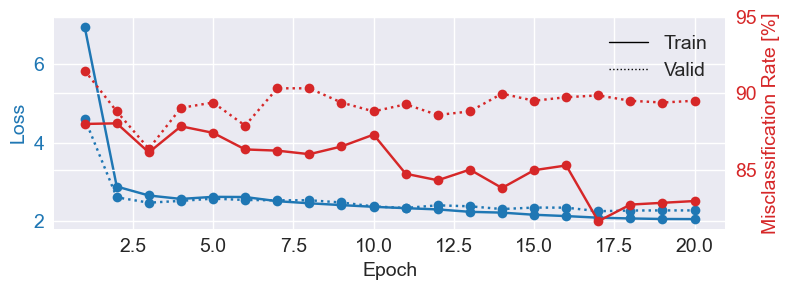

In [20]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pandas as pd

# Extract loss and accuracy values for plotting from history object
results_columns = ['train_loss', 'valid_loss', 'train_accuracy', 'valid_accuracy']
df = pd.DataFrame(clf.history[:, results_columns], columns=results_columns,
                  index=clf.history[:, 'epoch'])

# get percent of misclass for better visual comparison to loss
df = df.assign(train_misclass=100 - 100 * df.train_accuracy,
               valid_misclass=100 - 100 * df.valid_accuracy)

plt.style.use('seaborn')
fig, ax1 = plt.subplots(figsize=(8, 3))
df.loc[:, ['train_loss', 'valid_loss']].plot(
    ax=ax1, style=['-', ':'], marker='o', color='tab:blue', legend=False, fontsize=14)

ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=14)
ax1.set_ylabel("Loss", color='tab:blue', fontsize=14)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

df.loc[:, ['train_misclass', 'valid_misclass']].plot(
    ax=ax2, style=['-', ':'], marker='o', color='tab:red', legend=False)
ax2.tick_params(axis='y', labelcolor='tab:red', labelsize=14)
ax2.set_ylabel("Misclassification Rate [%]", color='tab:red', fontsize=14)
ax2.set_ylim(ax2.get_ylim()[0], 95)  # make some room for legend
ax1.set_xlabel("Epoch", fontsize=14)

# where some data has already been plotted to ax
handles = []
handles.append(Line2D([0], [0], color='black', linewidth=1, linestyle='-', label='Train'))
handles.append(Line2D([0], [0], color='black', linewidth=1, linestyle=':', label='Valid'))
plt.legend(handles, [h.get_label() for h in handles], fontsize=14)
plt.tight_layout()

## Confusion Matrix

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data from preloaded Raw for 1 events and 126 original time points ...
Using data f

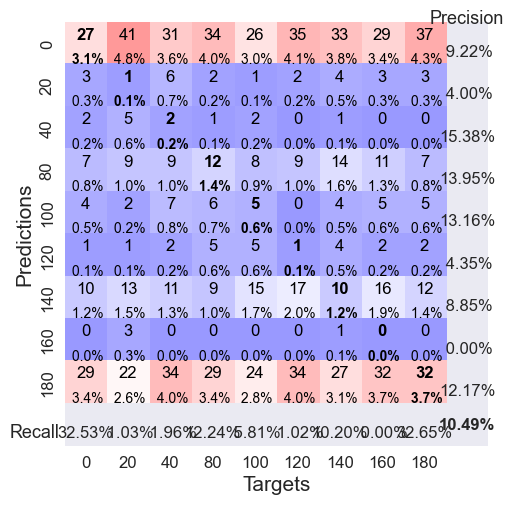

In [21]:
from sklearn.metrics import confusion_matrix
from braindecode.visualization import plot_confusion_matrix

# generate confusion matrices
# get the targets
#y_true = valid_set.get_metadata().target
y_true = [valid_set.datasets[i].y for i in range(len(valid_set.datasets))]
y_pred = clf.predict(valid_set)

# generating confusion matrix
confusion_mat = confusion_matrix(y_true, y_pred)

# add class labels
# label_dict is class_name : str -> i_class : int
label_dict = {'0': 0, '20': 20, '40':40, '80':80,'100':100, '120':120,'140':140, '160':160, '180':180}
# sort the labels by values (values are integer class labels)
labels=label_dict.keys()

# plot the basic conf. matrix
plot_confusion_matrix(confusion_mat, class_names=labels);